# `Early Prediction of diabetes`

Diabetes is one of the most commom diseases worldwide. Early diagnosis aim to reduce its severity and risk factors. Early diagnosis focuses on detecting symptomatic patients as erly as possible. It leads to increased awareness of first signs of diabetes.  

Various machine learning classification algorithms such as Logistic Regression (LR), K-Nearest Neighbors model (KNN), Decision Tree (DT), Random Forest (RF) and Gradient Boosting (GB) are trained and evaluated for diabetes detection. Furthermore, grid search hyperparameter optimization was applied to tune hyperpatameters. 

### **Dataset description**

This dataset contains the sign and symptpom data of newly diabetic or would be diabetic patient from the northeastern part of South Asia (Bangladesh) 

It includes 16 features as discribed and the dependent variable 'Class'.

**Source:** https://archive.ics.uci.edu/ml/datasets/Early+stage+diabetes+risk+prediction+dataset.



**Attributes**: **Description** 
- Age: Between 16-90 years old
- Gender: Fameale or Male
- Polyuria (Y/N): Excessive secretion of urine
- Polydipsia (Y/N): Excessive thirst
- Sudden weight loss (Y/N)
- Weakness (Y/N)
- Polyphagia (Y/N): Excessive hunger
- Genital Thrush (Y/N) 
- Visual blurring (Y/N)
- Itching (Y/N)
- Irritability (Y/N)
- Delayed healing (Y/N)
- Partial paresis (Y/N): Reduction in muscle strength with limited range of movement
- Muscle stiffness (Y/N)
- Alopecia (Y/N): Hair loss
- Obesity (Y/N)
- Class (Positive or Negative): Diagnosis


### **Main goal**

- Testing the hypothesis:

*H0:* *It's feasible an early diagnosis of diabetes using direct questionnaires, considering an accuracy greater than 80%.*

- obtain insights by exploring the relationships between features abd target.

In [1]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt

import matplotlib as mpl
import seaborn as sns

In [2]:
df = pd.read_csv("diabetes_data_upload.csv")

In [3]:
round(df.describe(), 2)

,Age
count,520.00
mean,48.03
std,12.15
min,16.00
25%,39.00
50%,47.50
75%,57.00
max,90.00


In [4]:
df.describe(include='object')

,Gender,Polyuria,Polydipsia,sudden weight loss,weakness,Polyphagia,Genital thrush,visual blurring,Itching,Irritability,delayed healing,partial paresis,muscle stiffness,Alopecia,Obesity,class
count,520,520,520,520,520,520,520,520,520,520,520,520,520,520,520,520
unique,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
top,Male,No,No,No,Yes,No,No,No,No,No,No,No,No,No,No,Positive
freq,328,262,287,303,305,283,404,287,267,394,281,296,325,341,432,320


In [5]:
df.shape

(520, 17)

In [6]:
print(f'Total of misssing values: {df.isnull().sum().sum()}')

Total of misssing values: 0


In [7]:
# Examining the data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 520 entries, 0 to 519
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Age                 520 non-null    int64 
 1   Gender              520 non-null    object
 2   Polyuria            520 non-null    object
 3   Polydipsia          520 non-null    object
 4   sudden weight loss  520 non-null    object
 5   weakness            520 non-null    object
 6   Polyphagia          520 non-null    object
 7   Genital thrush      520 non-null    object
 8   visual blurring     520 non-null    object
 9   Itching             520 non-null    object
 10  Irritability        520 non-null    object
 11  delayed healing     520 non-null    object
 12  partial paresis     520 non-null    object
 13  muscle stiffness    520 non-null    object
 14  Alopecia            520 non-null    object
 15  Obesity             520 non-null    object
 16  class               520 no

In [8]:
df.dtypes.value_counts()

object    16
int64      1
dtype: int64

In [9]:
# Identifying the number of unique values each variable takes, then create list variables for categorical, numeric, binary, and ordinal variables.
pd.DataFrame([len(df[i].unique()) for i in df.columns], index=df.columns, columns = ['Unique Values'])

,Unique Values
Age,51
Gender,2
Polyuria,2
Polydipsia,2
sudden weight loss,2
weakness,2
Polyphagia,2
Genital thrush,2
visual blurring,2
Itching,2


Except for the gender variable, the categorical variables are all binary or dichotomous, i.e. they can only have two outcomes (either Y/N or Positive/Negative).         

## Data preprocessing
---

In [10]:
df1 = df.copy()

In [11]:
# Converting the nominal variable 'Gender' into dummies
df1 = pd.get_dummies(df1, columns=['Gender']).drop('Gender_Male', axis=1)

In [12]:
# Creating a list of binary categorical variables

binary_categorical_variables = [column for column in df1.columns if df1[column].dtypes == object \
                                and len(df1[column].unique()) == 2]

In [13]:
from sklearn.preprocessing import LabelBinarizer

In [14]:
label_binarizer = LabelBinarizer()

In [15]:
for column in binary_categorical_variables:
    df1[column] = label_binarizer.fit_transform(df1[column])

In [16]:
df1.head()

,Age,Polyuria,Polydipsia,sudden weight loss,weakness,Polyphagia,Genital thrush,visual blurring,Itching,Irritability,delayed healing,partial paresis,muscle stiffness,Alopecia,Obesity,class,Gender_Female
0,40,0,1,0,1,0,0,0,1,0,1,0,1,1,1,1,0
1,58,0,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0
2,41,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0
3,45,0,0,1,1,1,1,0,1,0,1,0,0,0,0,1,0
4,60,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,0


In [17]:
round(df1.describe(), 2)

,Age,Polyuria,Polydipsia,sudden weight loss,weakness,Polyphagia,Genital thrush,visual blurring,Itching,Irritability,delayed healing,partial paresis,muscle stiffness,Alopecia,Obesity,class,Gender_Female
count,520.00,520.0,520.00,520.00,520.00,520.00,520.00,520.00,520.00,520.00,520.00,520.00,520.00,520.00,520.00,520.00,520.00
mean,48.03,0.5,0.45,0.42,0.59,0.46,0.22,0.45,0.49,0.24,0.46,0.43,0.38,0.34,0.17,0.62,0.37
std,12.15,0.5,0.50,0.49,0.49,0.50,0.42,0.50,0.50,0.43,0.50,0.50,0.48,0.48,0.38,0.49,0.48
min,16.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,39.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,47.50,0.0,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
75%,57.00,1.0,1.00,1.00,1.00,1.00,0.00,1.00,1.00,0.00,1.00,1.00,1.00,1.00,0.00,1.00,1.00
max,90.00,1.0,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


In [18]:
# The positive and negative cases are relatively balanced.

df1['class'].value_counts()

1    320
0    200
Name: class, dtype: int64

In [19]:
corr_matrix = df1.corr()

In [20]:
mask_1 = corr_matrix > 0.4
mask_2 = corr_matrix < -0.3

corr_matrix_2 = corr_matrix[mask_1 | mask_2]

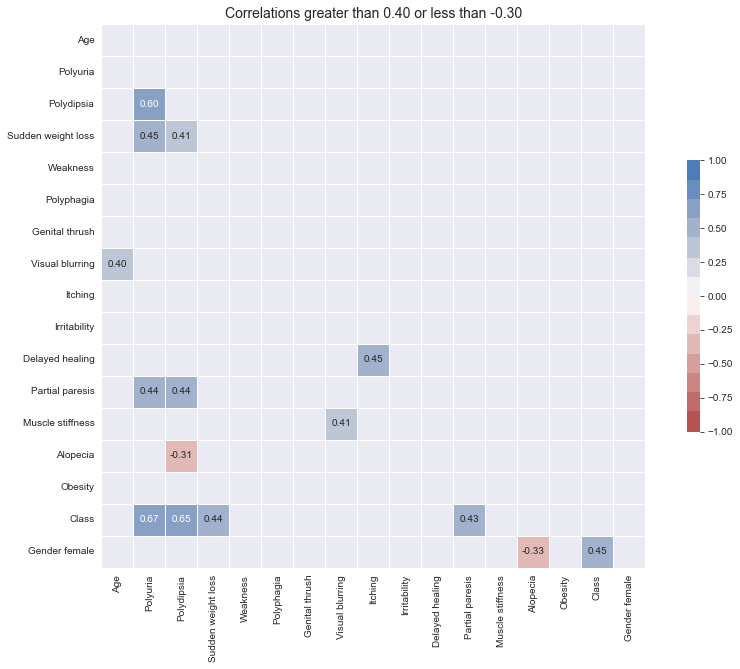

In [21]:
plt.figure(figsize=(15,10))

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr_matrix_2, dtype=bool))

sns.set_style("dark")
cmap = sns.color_palette("vlag_r", 14)

labels = [column_name.replace('_', ' ').capitalize() for column_name in corr_matrix_2.columns]

sns.heatmap(corr_matrix_2, mask=mask, cmap=cmap, annot = True, fmt='.2f', 
            xticklabels = labels, yticklabels = labels, vmin=-1.0, vmax=1.0, center=0.0, 
            square=True, linewidths=.5, cbar_kws={"shrink": .5});


plt.title("Correlations greater than 0.40 or less than -0.30", fontsize=14);

The attributes most correlated with each other are polydipsia (excessive thirst) and polyuria (excessive urination). Furthermore, sudden weight loss and partial paresis (loss of strength) are also correlated with fluid loss, associated with polydipsia and polyuria attributes.

In general, there were more attributes with positive correlation than negative. The positive correlation also assumed higher values, with the maximum observed inverse correlation of -0.33 between alopecia and the female gender. None of these showed a correlation greater than 0.40 or less than -0.30 in relation to the target variable.


In [22]:
feature_cols = df1.drop('class', axis=1).columns
y = df1['class']

In [23]:
correlations = df1[feature_cols].corrwith(y)
correlations.sort_values(inplace=True)

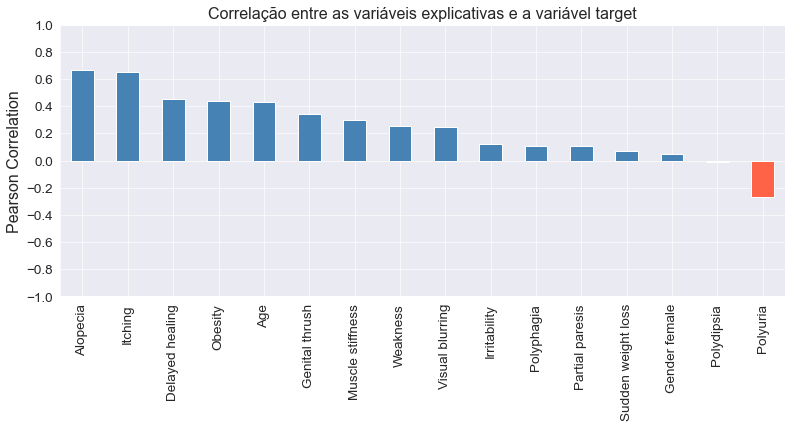

In [24]:
# A variáveis independentes mais correlacionadas com a váriavel target
 

correlations[::-1].plot.bar(figsize = (13,5),
                                     color=(correlations[::-1] > 0).map({True:'steelblue', 
                                                                         False:'tomato'}))


# Formatação dos rótulos do eixo x
labels=[label.replace('_', ' ').capitalize() for label in correlations.index]

# Formatação do gráfico
plt.title("Correlação entre as variáveis explicativas e a variável target", fontsize=16)
plt.xlabel(None)
plt.ylim(-1.0, 1.0)
plt.grid(True, alpha=.8)
plt.grid(which='minor', color='gray', linestyle='--', alpha=0.1)
plt.xticks(range(len(labels)), labels, fontsize=13.5)
plt.yticks(np.arange(-1.0, 1.1, step=0.2), fontsize=13.5)
plt.ylabel('Pearson Correlation', fontsize=16);

The attributes most positively correlated with the target variable were polyuria and polydipsia, with correlation greater than 0.60, and sudden weight loss and partial paresis, with correlation greater than 0.40.

Only the alopecia attribute showed a negative correlation with the target, even so, it was greater than -0.30. 

In [25]:
# Add some random noise to the

X_categorical_columns = df1.drop(['Age', 'class'], axis=1).columns.tolist()

df2 = df1.copy()

for column in X_categorical_columns: 
    noise = np.random.choice(np.arange(-.4,.4, .0005), size=520)
    df2[column] = df2[column] + noise

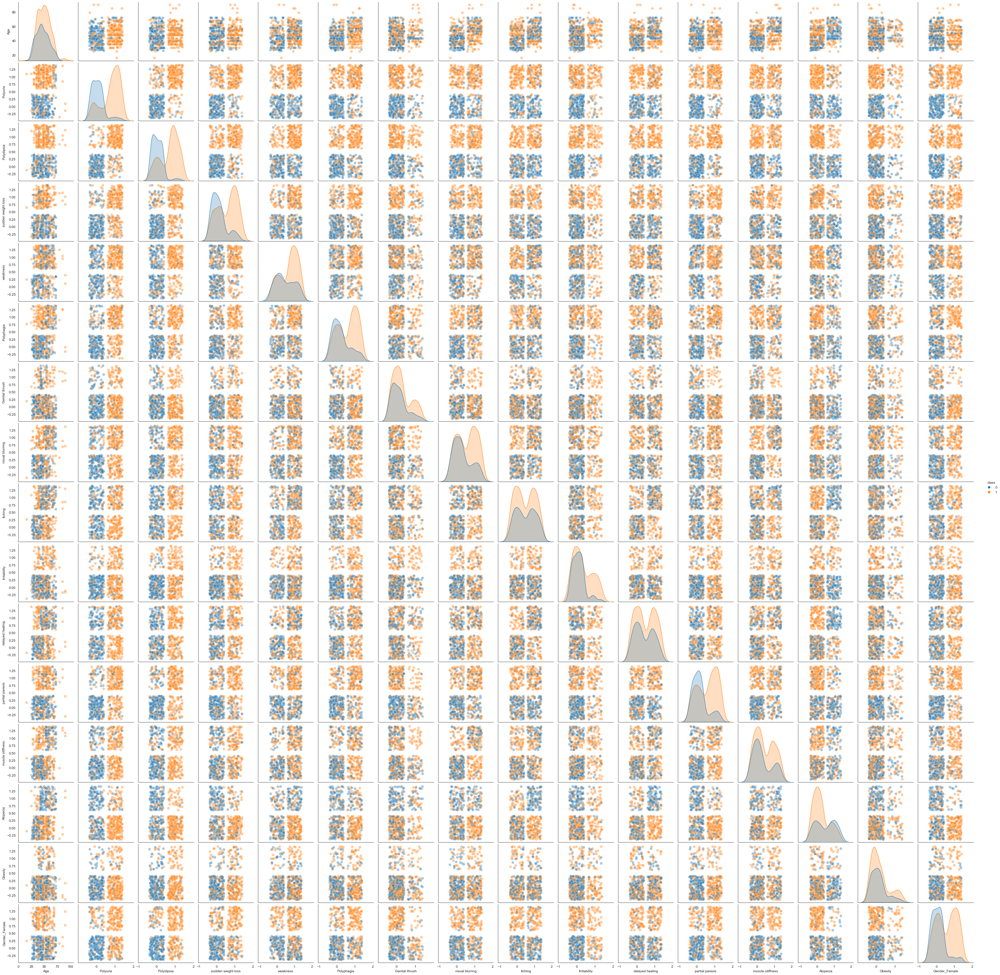

In [26]:
sns.set_style('white')
sns.pairplot(df2, hue='class', plot_kws={'alpha':.4, 's':60})


In [27]:
import warnings
warnings.simplefilter("ignore")

Distribuitions of observations for each feature:


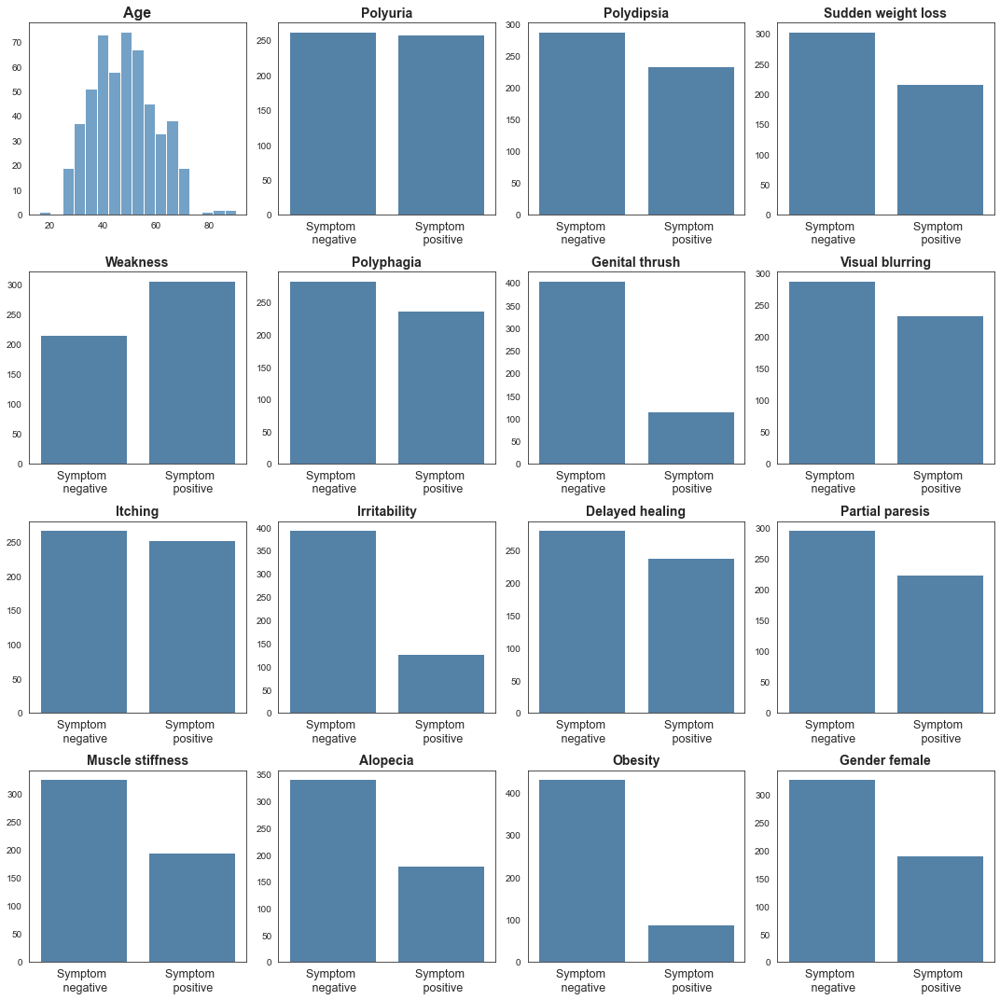

In [28]:
X_categorical_columns = df1.drop(['Age', 'class'], axis=1).columns.tolist()
X_categorical_titles = [i.replace('_', ' ').capitalize() for i in X_categorical_columns]


axes_list=[]
for i in range(4):
    for ii in range(4):
        sublist = [i,ii]
        axes_list.append(sublist)

fig, ax = plt.subplots(4,4, figsize=(15,15))

feature_distribuition = sns.histplot(df['Age'], ax=ax[0,0], color='steelblue')
feature_distribuition.set_title('Age', fontsize=16, weight='bold')
feature_distribuition.set_xlabel(None)
feature_distribuition.set_ylabel(None)

n=1
for column in X_categorical_columns:
    axes = axes_list[n]
    feature_distribuition = sns.countplot(df1[column], ax=ax[axes[0],axes[1]], color='steelblue')
    
    feature_distribuition.set_title(X_categorical_titles[n-1], fontsize=14, weight='bold')
    feature_distribuition.set_xlabel(None)
    feature_distribuition.set_ylabel(None)
    feature_distribuition.set_xticklabels(['Symptom \n negative','Symptom \n positive'], fontsize=12.5)

    n= n+1

print('Distribuitions of observations for each feature:')
fig.tight_layout()
plt.show();

## Numerical feature scaling
---

Now that the data are encoded and scaled, the features (X) are separated from the target (y, class).

In [29]:
from sklearn.preprocessing import MinMaxScaler
minmax = MinMaxScaler()

In [30]:
df1['Age'] = minmax.fit_transform(pd.DataFrame(df1['Age'], columns=['Age']))

In [31]:
outputfile = 'diabetes_data_processed.csv'
df1.to_csv(outputfile, index=False)

## Spliting the data into train and test data sets



To maintain the same ratio of predictor classes, it was used Scikit-learn's "StratifiedShuffleSplit" method to split the data into train and test data sets. 

In [32]:
from sklearn.model_selection import StratifiedShuffleSplit

strat_shuf_split = StratifiedShuffleSplit(n_splits=1, 
                                          test_size=0.3, 
                                          random_state=42)


feature_cols = df1.drop('class', axis=1).columns.tolist()

# Get the split indexes
train_idx, test_idx = next(strat_shuf_split.split(df1[feature_cols], df1['class']))

# Create the dataframes
X_train = df1.loc[train_idx, feature_cols]
y_train = df1.loc[train_idx, 'class']

X_test  = df1.loc[test_idx, feature_cols]
y_test  = df1.loc[test_idx, 'class']

In [33]:
# Comparing the ratio of target classes in both the train and test splits

print(" Comparativo entre as proporções das classes da target nos subconjuntos de treino e teste: ")
pd.concat([y_train.value_counts(normalize=True)]+[y_test.value_counts(normalize=True)], axis=1, keys=['Train','Test']).round(4)

 Comparativo entre as proporções das classes da target nos subconjuntos de treino e teste: 


,Train,Test
1,0.6154,0.6154
0,0.3846,0.3846


# **Modelagem**

## Logistic regression
--- 

In [34]:
from sklearn.linear_model import LogisticRegression

# Standard logistic regression
lr = LogisticRegression(solver='liblinear').fit(X_train, y_train)

In [35]:
from sklearn.linear_model import LogisticRegression

# L1 regularized logistic regression
lr_l1 = LogisticRegression(C=10, penalty='l1', solver='liblinear').fit(X_train, y_train)

In [36]:
# L2 regularized logistic regression
lr_l2 = LogisticRegression(C=10, penalty='l2', solver='liblinear').fit(X_train, y_train)

In [37]:
# Predict the class and the probability for each
y_pred = list()
y_prob = list()

coeff_labels = ['lr', 'l1', 'l2']
coeff_models = [lr, lr_l1, lr_l2]

for lab,mod in zip(coeff_labels, coeff_models):
    y_pred.append(pd.Series(mod.predict(X_test), name=lab))
    y_prob.append(pd.Series(mod.predict_proba(X_test).max(axis=1), name=lab))
    
y_pred = pd.concat(y_pred, axis=1)
y_prob = pd.concat(y_prob, axis=1)

In [38]:
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, classification_report, f1_score
from sklearn.preprocessing import label_binarize

metrics = list()
cm = dict()

for lab in coeff_labels:

    # Preciision, recall, f-score from the multi-class support function
    precision, recall, fscore, _ = score(y_test, y_pred[lab], average='weighted')
    
    # The usual way to calculate accuracy
    accuracy = accuracy_score(y_test, y_pred[lab])
    
    # ROC-AUC scores can be calculated by binarizing the data
    auc = roc_auc_score(label_binarize(y_test, classes=[0,1]),
              label_binarize(y_pred[lab], classes=[0,1]), 
              average='weighted')
    
    # Last, the confusion matrix
    cm[lab] = confusion_matrix(y_test, y_pred[lab])
    
    metrics.append(pd.Series({'precision':precision, 'recall':recall, 
                              'fscore':fscore, 'accuracy':accuracy,
                              'auc':auc}, 
                             name=lab))

metrics = pd.concat(metrics, axis=1)

In [39]:
metrics.round(3)

,lr,l1,l2
precision,0.925,0.912,0.925
recall,0.923,0.910,0.923
fscore,0.923,0.911,0.923
accuracy,0.923,0.910,0.923
auc,0.925,0.911,0.925


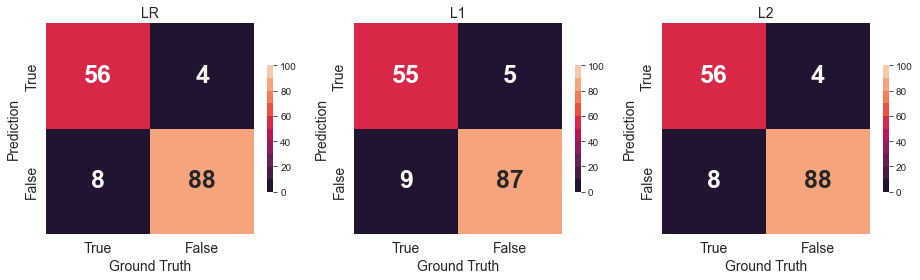

In [40]:
fig, axList = plt.subplots(nrows=1, ncols=3)
axList = axList.flatten()
fig.set_size_inches(13, 4)

cmap = sns.color_palette("rocket", 10)

for ax,lab in zip(axList, coeff_labels):
    sns.heatmap(cm[lab], ax=ax, annot=True, cmap=cmap, fmt='d', 
                annot_kws={"size": 25, "weight": "bold"}, 
                vmin=0.0, vmax=100, center=50.0, cbar_kws={"shrink": 0.6});
    ax.set_title(label=lab.upper(), fontsize=14);

    labels = ['True', 'False']
    ax.set_xticklabels(labels, fontsize=14);
    ax.set_yticklabels(labels, fontsize=14);
    ax.set_ylabel('Prediction', fontsize=14);
    ax.set_xlabel('Ground Truth', fontsize=14);
    
plt.tight_layout()

## K-Nearest Neighbors model
---

The value for K was defined focused on two measures, F-1 Scores and Error Rate (1-Accuracy), of the results for values of K from 1 to 40.  

In [41]:
from sklearn.neighbors import KNeighborsClassifier

In [42]:
max_k = 40
f1_scores = list()
error_rates = list() # 1-accuracy

for k in range(1, max_k):
    
    knn = KNeighborsClassifier(n_neighbors=k, weights='distance')
    knn = knn.fit(X_train, y_train)
    
    y_pred = knn.predict(X_test)
    f1_scores.append((k, round(f1_score(y_test, y_pred), 4)))
    error = 1-round(accuracy_score(y_test, y_pred), 4)
    error_rates.append((k, error))
    
f1_results = pd.DataFrame(f1_scores, columns=['K', 'F1 Score'])
error_results = pd.DataFrame(error_rates, columns=['K', 'Error Rate'])

<Figure size 600x400 with 0 Axes>

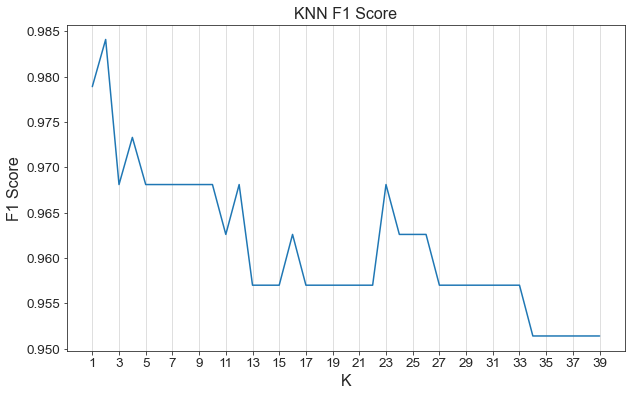

In [43]:
# Plot Accuracy (Error Rate) results
#sns.set_context('talk')
sns.set_style('ticks')

plt.figure(dpi=100)
ax = f1_results.set_index('K').plot(figsize=(10, 6), linewidth=1.5, legend=None)
ax.set_xlabel('K', fontsize=16)
ax.set_ylabel('F1 Score', fontsize=16)
ax.set_xticks(range(1, max_k, 2))
ax.grid(which='major', axis='x', color='gray', linestyle='-', linewidth=.5, alpha=.5)
ax.set_title('KNN F1 Score', fontsize=16)
ax.tick_params(axis='both', which='major', labelsize=13.5)
plt.savefig('knn_elbow.png');

<Figure size 600x400 with 0 Axes>

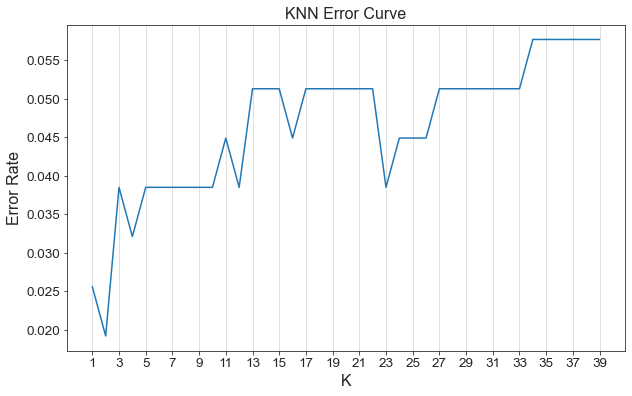

In [44]:
# Plot Accuracy (Error Rate) results
#sns.set_context('talk')
sns.set_style('ticks')

plt.figure(dpi=100)
ax = error_results.set_index('K').plot(figsize=(10, 6), linewidth=1.5, legend=None)
ax.set_xlabel('K', fontsize=16)
ax.set_ylabel('Error Rate', fontsize=16)
ax.set_xticks(range(1, max_k, 2))
ax.grid(which='major', axis='x', color='gray', linestyle='-', linewidth=.5, alpha=.5)
ax.set_title('KNN Error Curve', fontsize=16)
ax.tick_params(axis='both', which='major', labelsize=13.5)
plt.savefig('knn_elbow.png');

In [45]:
# Estimating KNN model and report outcomes
knn = KNeighborsClassifier(n_neighbors=2)
knn = knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
# Preciision, recall, f-score from the multi-class support function
print(classification_report(y_test, y_pred))
print('Accuracy score: ', round(accuracy_score(y_test, y_pred), 2))
print('F1 Score: ', round(f1_score(y_test, y_pred), 2))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94        60
           1       1.00      0.92      0.96        96

    accuracy                           0.95       156
   macro avg       0.94      0.96      0.95       156
weighted avg       0.95      0.95      0.95       156

Accuracy score:  0.95
F1 Score:  0.96


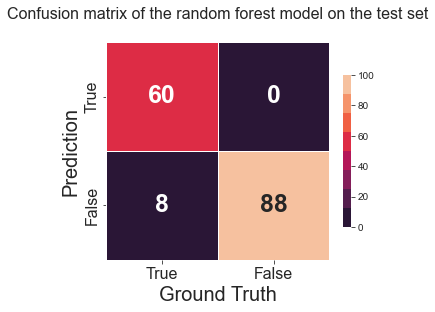

In [46]:
# Plot confusion matrix
#sns.set_palette(sns.color_palette(colors))

cmap = sns.color_palette("rocket", 8)

_, ax = plt.subplots(figsize=(5,4))
ax = sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, 
                 cmap=cmap, fmt='d', annot_kws={"size": 25, "weight": "bold"},
                 vmin=0.0, vmax=100, center=50.0, 
                 linewidths=.5, cbar_kws={"shrink": .7})  

labels = ['True', 'False']
ax.set_title("Confusion matrix of the random forest model on the test set\n", fontsize=16);
ax.set_xticklabels(labels, fontsize=16);
ax.set_yticklabels(labels, fontsize=16);
ax.set_ylabel('Prediction', fontsize=20);
ax.set_xlabel('Ground Truth', fontsize=20);

## Decision Tree Model
---

In [47]:
from sklearn.tree import DecisionTreeClassifier

decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree = decision_tree.fit(X_train, y_train)

In [48]:
# The number of nodes and the maximum actual depth.
decision_tree.tree_.node_count, decision_tree.tree_.max_depth

(61, 9)

In [49]:
# A function to return error metrics.

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def measure_error(y_true, y_pred, label):
    return pd.Series({'Accuracy':accuracy_score(y_true, y_pred),
                      'Precision': precision_score(y_true, y_pred),
                      'Recall': recall_score(y_true, y_pred),
                      'F-1 Score': f1_score(y_true, y_pred)},
                      name=label)

In [50]:
# The error on the training and test data sets
y_train_pred = decision_tree.predict(X_train)
y_test_pred = decision_tree.predict(X_test)

train_test_full_error = pd.concat([measure_error(y_train, y_train_pred, 'Train set').round(2),
                              measure_error(y_test, y_test_pred, 'Test set').round(3)],
                              axis=1)

train_test_full_error

,Train set,Test set
Accuracy,1.0,0.962
Precision,1.0,0.969
Recall,1.0,0.969
F-1 Score,1.0,0.969


Using grid search with cross validation, seeking to find a decision tree that performs well on the test data set.

In [51]:
from sklearn.model_selection import GridSearchCV

param_grid = {'max_depth':range(1, decision_tree.tree_.max_depth+1, 2),
              'max_features': range(1, len(decision_tree.feature_importances_)+1)}

grid_search_decision_tree = GridSearchCV(DecisionTreeClassifier(random_state=42),
                                         param_grid=param_grid,
                                         scoring='accuracy',
                                         n_jobs=-1)

grid_search_decision_tree = grid_search_decision_tree.fit(X_train, y_train)

In [52]:
# The number of nodes and the maximum depth of the tree.
grid_search_decision_tree.best_estimator_.tree_.node_count, grid_search_decision_tree.best_estimator_.tree_.max_depth

(35, 5)

Measuring the errors on the training and test sets using mean squared error.

In [53]:
y_train_pred_gr = grid_search_decision_tree.predict(X_train)
y_test_pred_gr = grid_search_decision_tree.predict(X_test)

train_test_gr_error = pd.concat([measure_error(y_train, y_train_pred_gr, 'train'),
                                 measure_error(y_test, y_test_pred_gr, 'test')],
                                axis=1)

train_test_gr_error

,train,test
Accuracy,0.975275,0.948718
Precision,0.995392,0.988889
Recall,0.964286,0.927083
F-1 Score,0.979592,0.956989


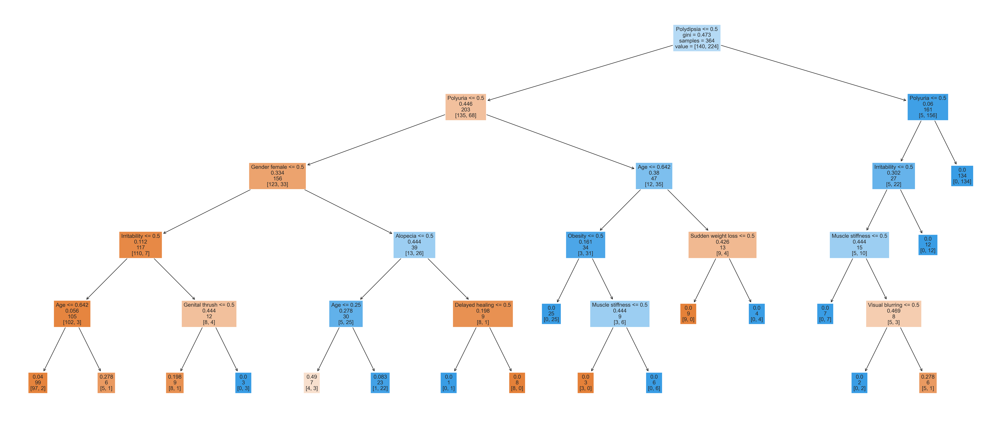

In [54]:
from sklearn.tree import plot_tree

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(35,15),dpi=300)

feature_names = [label.replace('_', ' ').capitalize() for label in feature_cols]

plot_tree(grid_search_decision_tree.best_estimator_,
          feature_names=feature_names,
          label='root', 
          filled=True)

plt.show()

## Radom forest model
---

In [55]:
from sklearn.ensemble import RandomForestClassifier

In [56]:
# Initialize the random forest estimator
# Note that the number of trees is not setup here
RF = RandomForestClassifier(oob_score=True, 
                            random_state=42, 
                            warm_start=True,
                            n_jobs=-1)

oob_list = list()

# Iterate through all of the possibilities for 
# number of trees
for n_trees in [15, 20, 30, 40, 50, 100, 150, 200, 300, 400]:
    
    # Use this to set the number of trees
    RF.set_params(n_estimators=n_trees)

    # Fit the model
    RF.fit(X_train, y_train)

    # Get the oob error
    oob_error = 1 - RF.oob_score_
    
    # Store it
    oob_list.append(pd.Series({'n_trees': n_trees, 'oob': oob_error}))

rf_oob_df = pd.concat(oob_list, axis=1).T.set_index('n_trees')

rf_oob_df

,oob
n_trees,
15.0,0.054945
20.0,0.038462
30.0,0.030220
40.0,0.027473
50.0,0.027473
100.0,0.030220
150.0,0.030220
200.0,0.032967
300.0,0.030220


In [57]:
print(f'O menor out-of-bag erro econtrado ocorreu no modelo com {int(rf_oob_df.idxmin())} árvores.');

O menor out-of-bag erro econtrado ocorreu no modelo com 40 árvores.


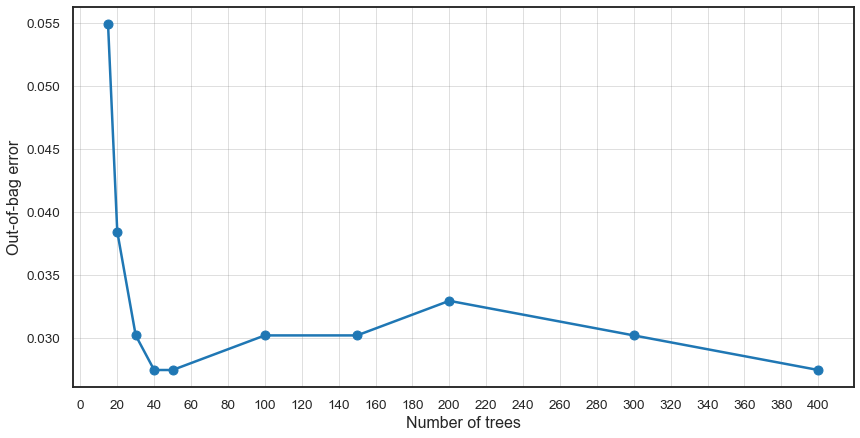

In [58]:
sns.set_context('talk')
sns.set_style('white')

ax = rf_oob_df.plot(legend=False, marker='o', figsize=(14, 7), linewidth=2.5)
ax.set(ylabel='out-of-bag error')


ax.set_xlabel('Number of trees', fontsize=16)
ax.set_ylabel('Out-of-bag error', fontsize=16)
ax.set_xticks(range(0, 420, 20))
ax.grid(which='major', axis='both', color='gray', linestyle='-', linewidth=.5, alpha=.5)
ax.tick_params(axis='both', which='major', labelsize=13.5)
plt.savefig('oob_error.png');

The model with 40 trees performed well was selected. And then it were calculated error metrics and a confusion matrix on the test data set.

In [59]:
# Random forest with 100 estimators
model = RF.set_params(n_estimators=40)

y_pred = model.predict(X_test)

In [60]:
cr = classification_report(y_test, y_pred)
print(cr)

score_df = pd.DataFrame({'accuracy': accuracy_score(y_test, y_pred),
                         'precision': precision_score(y_test, y_pred),
                         'recall': recall_score(y_test, y_pred),
                         'f1': f1_score(y_test, y_pred),
                         'auc': roc_auc_score(y_test, y_pred)},
                         index=pd.Index([0]))

print(score_df)

              precision    recall  f1-score   support

           0       0.98      0.97      0.97        60
           1       0.98      0.99      0.98        96

    accuracy                           0.98       156
   macro avg       0.98      0.98      0.98       156
weighted avg       0.98      0.98      0.98       156

   accuracy  precision    recall        f1       auc
0  0.980769   0.979381  0.989583  0.984456  0.978125


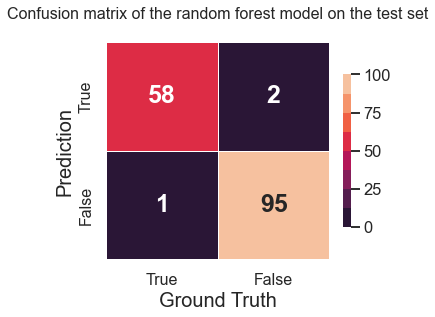

In [61]:
# Plot confusion matrix
#sns.set_palette(sns.color_palette(colors))

cmap = sns.color_palette("rocket", 8)

_, ax = plt.subplots(figsize=(5,4))
ax = sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, 
                 cmap=cmap, fmt='d', annot_kws={"size": 25, "weight": "bold"},
                 vmin=0.0, vmax=100, center=50.0, 
                 linewidths=.5, cbar_kws={"shrink": .7})  

labels = ['True', 'False']
ax.set_title("Confusion matrix of the random forest model on the test set\n", fontsize=16);
ax.set_xticklabels(labels, fontsize=16);
ax.set_yticklabels(labels, fontsize=16);
ax.set_ylabel('Prediction', fontsize=20);
ax.set_xlabel('Ground Truth', fontsize=20);

The ROC-AUC and precision-recall curves.

In [62]:
from sklearn.metrics import roc_curve, precision_recall_curve

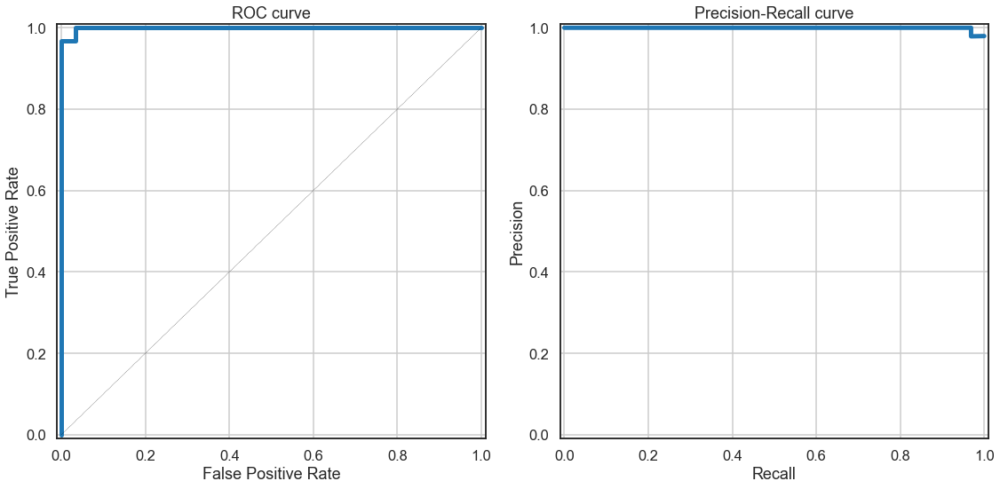

In [63]:
fig, axList = plt.subplots(ncols=2)
fig.set_size_inches(16, 8)

# Get the probabilities for each of the two categories
y_prob = model.predict_proba(X_test)

# Plot the ROC-AUC curve
ax = axList[0]

fpr, tpr, thresholds = roc_curve(y_test, y_prob[:,1])
ax.plot(fpr, tpr, linewidth=5)
# It is customary to draw a diagonal dotted line in ROC plots.
# This is to indicate completely random prediction. Deviation from this
# dotted line towards the upper left corner signifies the power of the model.
ax.plot([0, 1], [0, 1], ls='--', color='black', lw=.3)
ax.set(xlabel='False Positive Rate',
       ylabel='True Positive Rate',
       xlim=[-.01, 1.01], ylim=[-.01, 1.01],
       title='ROC curve')
ax.grid(True)

# Plot the precision-recall curve
ax = axList[1]

precision, recall, _ = precision_recall_curve(y_test, y_prob[:,1])
ax.plot(recall, precision, linewidth=5)
ax.set(xlabel='Recall', ylabel='Precision',
       xlim=[-.01, 1.01], ylim=[-.01, 1.01],
       title='Precision-Recall curve')
ax.grid(True)

plt.tight_layout()

In [64]:
# Calculate AUC
auc = roc_auc_score(y_test, y_prob[:,1]).round(5)
print(f'AUC: {auc}')

AUC: 0.99896


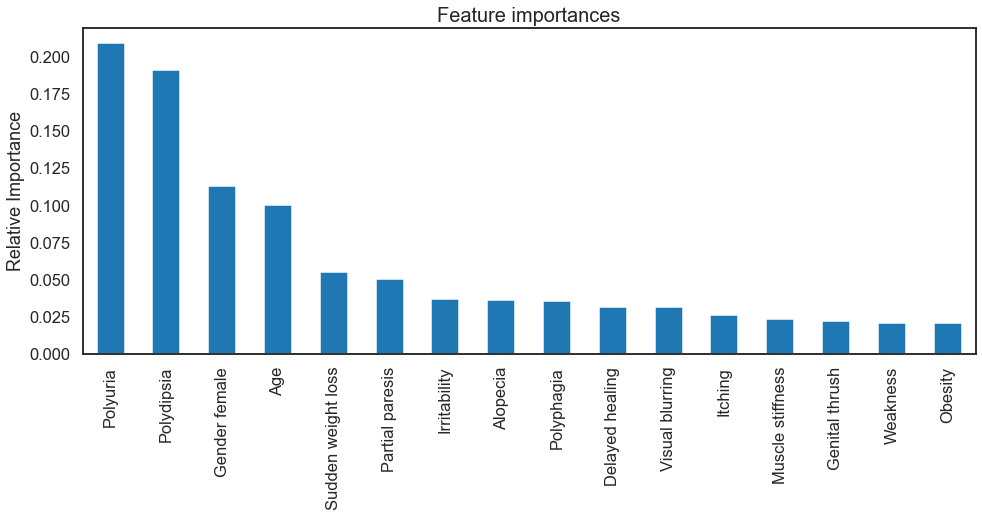

In [65]:
feature_imp = pd.Series(model.feature_importances_, index=feature_names).sort_values(ascending=False)

ax = feature_imp.plot(kind='bar', figsize=(16, 6))
ax.set_title('Feature importances', fontsize=20)
ax.set(ylabel='Relative Importance');

## Gradient boosted tree model
---

In [66]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV

In [67]:
# The parameters to be fit
param_grid = {'n_estimators': [15, 25, 50, 100, 200, 400],
              'learning_rate': [0.1, 0.01, 0.001, 0.0001],
              'subsample': [1.0, 0.5],
              'max_features': [1, 2, 3, 4]}

# The grid search object
GV_GBC = GridSearchCV(GradientBoostingClassifier(random_state=42), 
                      param_grid=param_grid, 
                      scoring='accuracy',
                      n_jobs=-1)

# The grid search
GV_GBC = GV_GBC.fit(X_train, y_train)

In [68]:
# The best model
GV_GBC.best_estimator_

GradientBoostingClassifier(max_features=1, n_estimators=200, random_state=42)

In [69]:
y_pred = GV_GBC.predict(X_test)
print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

           0       0.98      0.95      0.97        62
           1       0.97      0.99      0.98        94

    accuracy                           0.97       156
   macro avg       0.98      0.97      0.97       156
weighted avg       0.97      0.97      0.97       156



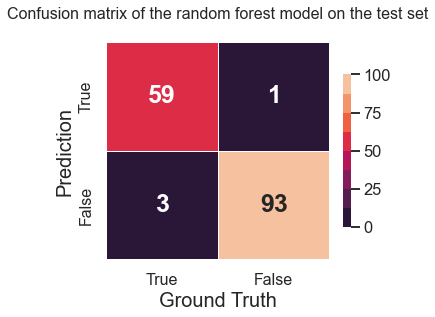

In [70]:
# Plot confusion matrix
#sns.set_palette(sns.color_palette(colors))

cmap = sns.color_palette("rocket", 8)

_, ax = plt.subplots(figsize=(5,4))
ax = sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, 
                 cmap=cmap, fmt='d', annot_kws={"size": 25, "weight": "bold"},
                 vmin=0.0, vmax=100, center=50.0, 
                 linewidths=.5, cbar_kws={"shrink": .7})  

labels = ['True', 'False']
ax.set_title("Confusion matrix of the random forest model on the test set\n", fontsize=16);
ax.set_xticklabels(labels, fontsize=16);
ax.set_yticklabels(labels, fontsize=16);
ax.set_ylabel('Prediction', fontsize=20);
ax.set_xlabel('Ground Truth', fontsize=20);

## Comparing the models
---

In [71]:
models_labels = ['Logistic Regression', 'KNN', 'Decision Tree', 'Random Forest', 'Gradient Boosting']

models = [lr, knn, grid_search_decision_tree, model, GV_GBC] 


In [72]:
# The error on the training and test data sets

test_full_error = pd.DataFrame()

for model, model_label in zip(models, models_labels):
    y_test_pred = model.predict(X_test)

    #  Applying the function to return error metrics                              
    test_full_error[model_label] = measure_error(y_test, y_test_pred, model).round(3)

In [73]:
test_full_error

,Logistic Regression,KNN,Decision Tree,Random Forest,Gradient Boosting
Accuracy,0.923,0.949,0.949,0.981,0.974
Precision,0.957,1.000,0.989,0.979,0.989
Recall,0.917,0.917,0.927,0.990,0.969
F-1 Score,0.936,0.957,0.957,0.984,0.979


According to the analyzed models, the Random Forest model presented better results to the predictive performance.